In [ ]:
# --- LANGKAH 1: BERSIH-BERSIH & INSTALASI ---
import os
import shutil

# 1. Hubungkan Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Hapus cache lama agar tidak ada error sisa masa lalu
caches = [
    "/root/.cache/huggingface/datasets",
    "/content/batik-lora-model"
]
for c in caches:
    if os.path.exists(c):
        shutil.rmtree(c)
        print(f"Cache lama dibersihkan: {c}")

# 3. Install Library Versi Development (PENTING untuk menghindari error versi)
print("Sedang menginstall library... (tunggu sebentar)")
!pip install -q git+https://github.com/huggingface/diffusers.git
!pip install -q -U -r https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/requirements.txt
!pip install -q bitsandbytes
!pip install -q peft

print("✅ Instalasi Selesai.")

# Load ekstensi TensorBoard
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/COLAB/ModelLora6/logs"

Mounted at /content/drive
Sedang menginstall library... (tunggu sebentar)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 114.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 469.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 71.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 60.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 3.2 MB/s eta 0:00:

<IPython.core.display.Javascript object>

In [ ]:
# --- LANGKAH 2: CARI GAMBAR & BUAT METADATA ---
import os
import json

# Kita arahkan langsung ke folder induk BATIK
# Script akan mencari sampai ke dalam-dalam subfolder apapun yang ada
ROOT_DIR = "/content/drive/MyDrive/COLAB/archive2/megamendung"

print(f"🔍 Memindai folder: {ROOT_DIR}")

metadata = []
image_extensions = ('.png', '.jpg', '.jpeg', '.webp')
total_images = 0

# Loop mencari gambar
for root, dirs, files in os.walk(ROOT_DIR):
    # Abaikan folder sampah sistem
    if ".ipynb_checkpoints" in root:
        continue

    for filename in files:
        if filename.lower().endswith(image_extensions):
            # Path lengkap gambar
            full_path = os.path.join(root, filename)

            # Ambil nama folder sebagai label gaya (misal: folder 'batik-parang')
            folder_name = os.path.basename(root)

            # Buat caption otomatis: "gaya_batik_batik_parang"
            clean_folder_name = folder_name.replace(" ", "_").replace("-", "_")
            caption = f"batik_style_{clean_folder_name}"

            # Masukkan ke daftar
            # Kita pakai path relatif agar script training tidak bingung
            try:
                rel_path = os.path.relpath(full_path, ROOT_DIR)
                metadata.append({
                    "file_name": rel_path,
                    "text": caption
                })
                total_images += 1
            except Exception as e:
                print(f"Skip file error: {filename}")

# Simpan file metadata.jsonl di ROOT_DIR
if total_images > 0:
    metadata_path = os.path.join(ROOT_DIR, "metadata.jsonl")
    with open(metadata_path, 'w') as f:
        for entry in metadata:
            json.dump(entry, f)
            f.write('\n')

    print(f"✅ SUKSES! Ditemukan {total_images} gambar.")
    print(f"📄 File metadata dibuat di: {metadata_path}")
    print(f"📝 Contoh caption: {metadata[0]['text']}")
else:
    print("❌ ERROR: Tidak ada gambar ditemukan di folder BATIK. Cek lagi lokasi file Anda di Google Drive.")

🔍 Memindai folder: /content/drive/MyDrive/COLAB/archive2/megamendung
✅ SUKSES! Ditemukan 106 gambar.
📄 File metadata dibuat di: /content/drive/MyDrive/COLAB/archive2/megamendung/metadata.jsonl
📝 Contoh caption: batik_style_megamendung


In [ ]:
# --- SCRIPT PELATIHAN FINAL (YANG BENAR) ---
import os

# 1. Konfigurasi Path (Sesuaikan jika perlu)
MODEL_BASE = "runwayml/stable-diffusion-v1-5"
DATASET_DIR = "/content/drive/MyDrive/COLAB/archive2/megamendung" # Path ke folder yang ada metadata.jsonl
OUTPUT_DIR = "/content/drive/MyDrive/COLAB/ModelLora6"      # Path output baru biar bersih

# 2. Install Library (Jaga-jaga jika sesi baru)
!pip install -q git+https://github.com/huggingface/diffusers transformers accelerate bitsandbytes

# 3. Jalankan Pelatihan
# PERHATIKAN PERUBAHAN PENTING DI BAWAH INI:
# - caption_column="text" (Sesuai metadata.jsonl Anda)
# - num_train_epochs=5    (Cukup untuk 1000 gambar)
# - checkpointing_steps   (Simpan backup tiap 500 langkah)

# --- DOWNLOAD SCRIPT TRAINING (WAJIB) ---
# Download dulu script-nya karena file ini tidak ada di komputer Anda,
# melainkan file dari library HuggingFace.

!wget -q -nc https://raw.githubusercontent.com/huggingface/diffusers/main/examples/text_to_image/train_text_to_image_lora.py

print("✅ Script training berhasil di-download!")

print("🚀 Memulai pelatihan Batik LoRA...")

!accelerate launch train_text_to_image_lora.py \
  --pretrained_model_name_or_path=$MODEL_BASE \
  --train_data_dir=$DATASET_DIR \
  --caption_column="text" \
  --resolution=512 \
  --random_flip \
  --train_batch_size=4 \
  --num_train_epochs=80 \
  --checkpointing_steps=500 \
  --learning_rate=1e-04 \
  --lr_scheduler="cosine" \
  --lr_warmup_steps=0 \
  --seed=42 \
  --output_dir=$OUTPUT_DIR \
  --rank=32 \
  --mixed_precision="fp16" \
  --report_to="tensorboard" \
  --logging_dir="$OUTPUT_DIR/logs"

print(f"✅ Pelatihan Selesai! Model disimpan di: {OUTPUT_DIR}")

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ Script training berhasil di-download!
🚀 Memulai pelatihan Batik LoRA...
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-12-10 08:34:10.957924: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765355650.998052    3210 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765355651.

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: gaya_Batik_megamendung, intricate pattern, high quality, 8k


  0%|          | 0/30 [00:00<?, ?it/s]

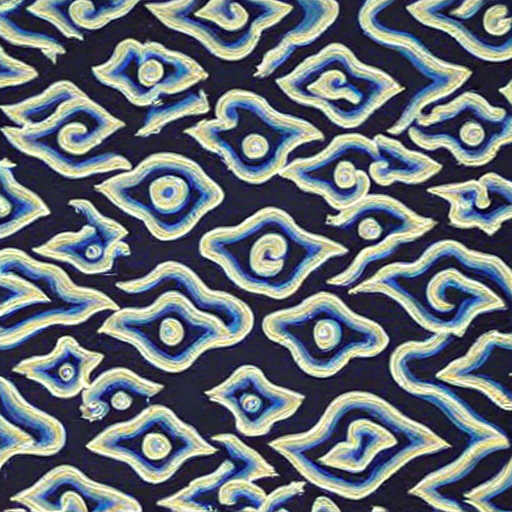

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# Path output dari langkah training di atas
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# Load LoRA (Cek apakah file ada dulu)
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# Prompt harus sesuai dengan caption di metadata Anda!
# Contoh: batik_style_batik_parang, batik_style_batik_megamendung
prompt = "gaya_Batik_megamendung, intricate pattern, high quality, 8k"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: gaya_Batik_megamendung, seamless texture, flat design, vector art style, high resolution, traditional indonesian art, clean lines


  0%|          | 0/30 [00:00<?, ?it/s]

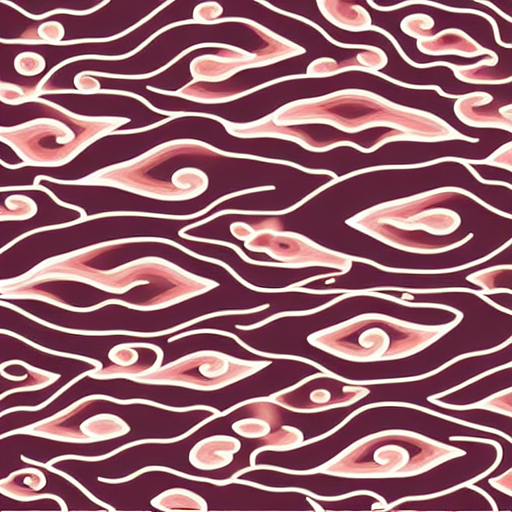

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# Path output dari langkah training di atas
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# Load LoRA (Cek apakah file ada dulu)
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# Prompt harus sesuai dengan caption di metadata Anda!
# Contoh: batik_style_batik_parang, batik_style_batik_megamendung
prompt = "gaya_Batik_megamendung, seamless texture, flat design, vector art style, high resolution, traditional indonesian art, clean lines"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: hoodie with batik_style_batik_megamendung, seamless texture, flat design, vector art style, high resolution, traditional indonesian art, clean lines


  0%|          | 0/50 [00:00<?, ?it/s]

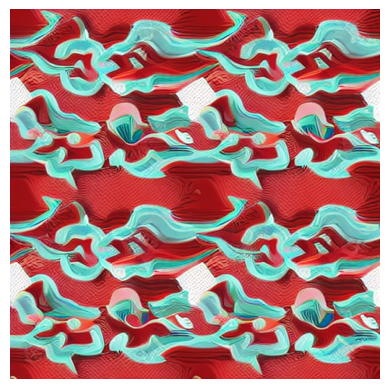

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# 1. Setup Path
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# 2. Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# --- MATIKAN SENSOR NSFW (PENTING) ---
pipe.safety_checker = None
pipe.requires_safety_checker = False

# 3. Load LoRA
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# 4. Generate dengan PROMPT YANG BENAR
# Sesuaikan dengan kode metadata.jsonl Anda sebelumnya ("batik_style_...")
prompt = "hoodie with batik_style_batik_megamendung, seamless texture, flat design, vector art style, high resolution, traditional indonesian art, clean lines"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

# 5. Tampilkan Gambar (Pakai Matplotlib biar aman)
plt.imshow(image)
plt.axis('off')
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: tumblr with batik_megamendung style, realistic, 4k


  0%|          | 0/50 [00:00<?, ?it/s]

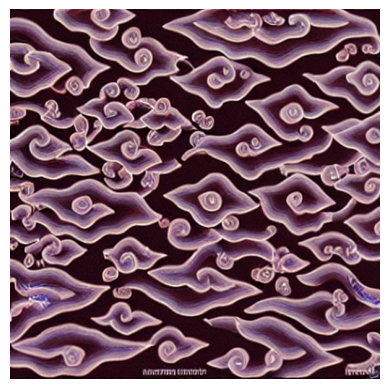

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# 1. Setup Path
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# 2. Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# --- MATIKAN SENSOR NSFW (PENTING) ---
pipe.safety_checker = None
pipe.requires_safety_checker = False

# 3. Load LoRA
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# 4. Generate dengan PROMPT YANG BENAR
# Sesuaikan dengan kode metadata.jsonl Anda sebelumnya ("batik_style_...")
prompt = "tumblr with batik_megamendung style, realistic, 4k"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

# 5. Tampilkan Gambar (Pakai Matplotlib biar aman)
plt.imshow(image)
plt.axis('off')
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: batik_style_megamendung pattern, intricate, traditional indonesian art


  0%|          | 0/50 [00:00<?, ?it/s]

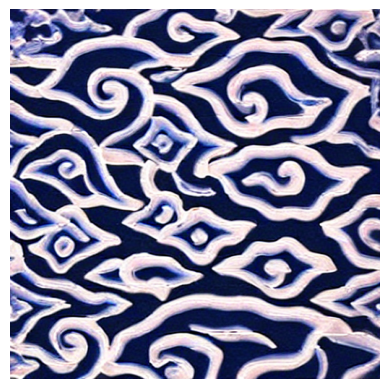

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# 1. Setup Path
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# 2. Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# --- MATIKAN SENSOR NSFW (PENTING) ---
pipe.safety_checker = None
pipe.requires_safety_checker = False

# 3. Load LoRA
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# 4. Generate dengan PROMPT YANG BENAR
# Sesuaikan dengan kode metadata.jsonl Anda sebelumnya ("batik_style_...")
prompt = "batik_style_megamendung pattern, intricate, traditional indonesian art"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

# 5. Tampilkan Gambar (Pakai Matplotlib biar aman)
plt.imshow(image)
plt.axis('off')
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA berhasil dimuat!
🎨 Generating: gaya_megamendung, traditional indonesian batik, blue cloud shape, sharp edges, high quality, 8k


  0%|          | 0/50 [00:00<?, ?it/s]

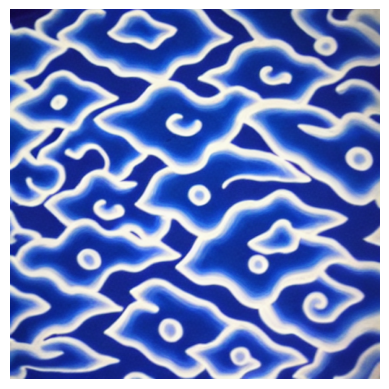

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# 1. Setup Path
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"

# 2. Load Model
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

# --- MATIKAN SENSOR NSFW (PENTING) ---
pipe.safety_checker = None
pipe.requires_safety_checker = False

# 3. Load LoRA
try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA berhasil dimuat!")
except Exception as e:
    print(f"❌ Gagal memuat LoRA: {e}")

# 4. Generate dengan PROMPT YANG BENAR
# Sesuaikan dengan kode metadata.jsonl Anda sebelumnya ("batik_style_...")
prompt = "gaya_megamendung, traditional indonesian batik, blue cloud shape, sharp edges, high quality, 8k"

print(f"🎨 Generating: {prompt}")
image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

# 5. Tampilkan Gambar (Pakai Matplotlib biar aman)
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# Path hasil training (sesuaikan jika perlu)
lora_path = "/content/drive/MyDrive/COLAB/ModelLora6"
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

try:
    pipe.load_lora_weights(lora_path)
    print("✅ LoRA Batik Siap.")
except:
    print("⚠️ Folder model belum ketemu. Cek path lagi.")

# --- RAHASIA AGAR GAMBAR SESUAI (NO. 1) ---

# 1. PROMPT POSITIF:
# Tambahkan kata: "Texture", "Pattern", "Full Frame", "Close up"
# Ini memaksa AI zoom-in ke kain, bukan memotret orang/pemandangan.
prompt = "batik_style_megamendung, close up texture of batik fabric, seamless pattern, traditional indonesian art, blue cloud motif, geometric triangle clouds, flat 2d design, vector style, high quality"

# 2. NEGATIVE PROMPT (PENTING BANGET!):
# Kita larang AI menggambar langit, gunung, dan orang.
negative_prompt = "scenery, landscape, mountain, realistic sky, real clouds, outdoors, person, human, face, skin, shirt, dress, clothing, fashion model, 3d render, photorealistic, perspective, depth"

# 3. SETTING GENERASI:
# guidance_scale = 7.0 (Standar penurutan perintah)
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=30,
    guidance_scale=7.0
).images[0]

image

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


⏳ Sedang memuat model...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/loaders/unet.py:214: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


🚀 Mulai generate dengan prompt: batik_style_megamendung, a closeup photo of a prem...


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 0.7


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 1.0


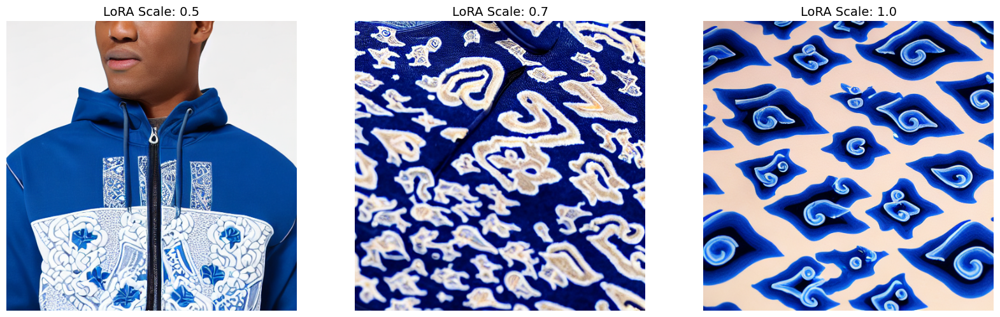

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# --- 1. SETTING FOLDER ---
# Arahkan ke folder output tempat kamu menyimpan model terakhir
MODEL_PATH = "/content/drive/MyDrive/COLAB/ModelLora6"
BASE_MODEL = "runwayml/stable-diffusion-v1-5"

# --- 2. LOAD MODEL ---
print("⏳ Sedang memuat model...")
pipe = StableDiffusionPipeline.from_pretrained(BASE_MODEL, torch_dtype=torch.float16)
pipe.unet.load_attn_procs(MODEL_PATH) # Load LoRA weights
pipe.to("cuda")

# --- 3. SETTING PROMPT ---
# Pastikan Trigger Word sesuai dengan metadata kamu (misal: batik_style_megamendung)
trigger_word = "batik_style_megamendung"

prompt = f"{trigger_word}, a closeup photo of a premium streetwear hoodie with intricate blue megamendung batik pattern, white background, studio lighting, 8k resolution, photorealistic"
negative_prompt = "low quality, blurry, bad anatomy, distorted, pattern on background, wall texture, noisy, ugly"

# --- 4. GENERATE DENGAN VARIASI SCALE ---
scales = [0.5, 0.7, 1.0] # Kita coba 3 tingkat kekuatan
images = []

print(f"🚀 Mulai generate dengan prompt: {prompt[:50]}...")

for scale in scales:
    # Cross_attention_kwargs={"scale": ...} adalah cara mengatur kekuatan LoRA
    image = pipe(
        prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=30,
        guidance_scale=7.5,
        cross_attention_kwargs={"scale": scale}
    ).images[0]
    images.append((scale, image))
    print(f"✅ Selesai scale {scale}")

# --- 5. TAMPILKAN HASIL ---
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
for i, (scale, img) in enumerate(images):
    axs[i].imshow(img)
    axs[i].set_title(f"LoRA Scale: {scale}", fontsize=14)
    axs[i].axis("off")

plt.show()

⏳ Sedang memuat model...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

🚀 Mulai generate dengan prompt: batik_style_megamendung, a premium streetwear hood...


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 0.7


  0%|          | 0/30 [00:00<?, ?it/s]

✅ Selesai scale 1.0


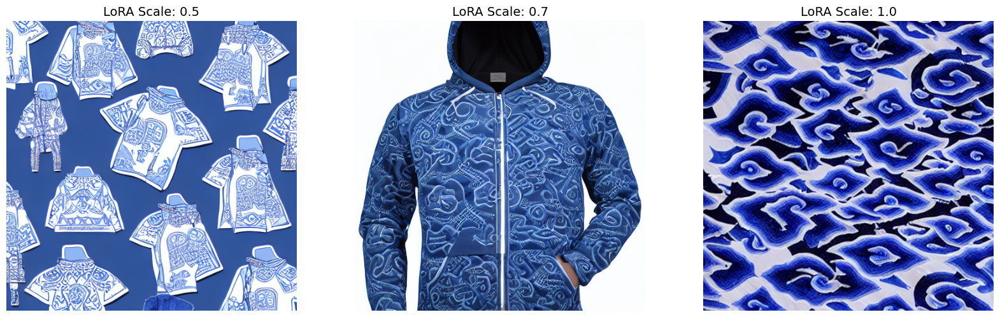

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# --- 1. SETTING FOLDER ---
# Arahkan ke folder output tempat kamu menyimpan model terakhir
MODEL_PATH = "/content/drive/MyDrive/COLAB/ModelLora6"
BASE_MODEL = "runwayml/stable-diffusion-v1-5"

# --- 2. LOAD MODEL ---
print("⏳ Sedang memuat model...")
pipe = StableDiffusionPipeline.from_pretrained(BASE_MODEL, torch_dtype=torch.float16)
pipe.unet.load_attn_procs(MODEL_PATH) # Load LoRA weights
pipe.to("cuda")

# --- 3. SETTING PROMPT ---
# Pastikan Trigger Word sesuai dengan metadata kamu (misal: batik_style_megamendung)
trigger_word = "batik_style_megamendung"

prompt = f"{trigger_word}, a premium streetwear hoodie with intricate blue megamendung batik pattern, white background, studio lighting, 8k resolution, photorealistic"
negative_prompt = "low quality, blurry, bad anatomy, distorted, pattern on background, wall texture, noisy, ugly"

# --- 4. GENERATE DENGAN VARIASI SCALE ---
scales = [0.5, 0.7, 1.0] # Kita coba 3 tingkat kekuatan
images = []

print(f"🚀 Mulai generate dengan prompt: {prompt[:50]}...")

for scale in scales:
    # Cross_attention_kwargs={"scale": ...} adalah cara mengatur kekuatan LoRA
    image = pipe(
        prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=30,
        guidance_scale=7.5,
        cross_attention_kwargs={"scale": scale}
    ).images[0]
    images.append((scale, image))
    print(f"✅ Selesai scale {scale}")

# --- 5. TAMPILKAN HASIL ---
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
for i, (scale, img) in enumerate(images):
    axs[i].imshow(img)
    axs[i].set_title(f"LoRA Scale: {scale}", fontsize=14)
    axs[i].axis("off")

plt.show()

⚙️ Memuat model dari: /content/drive/MyDrive/COLAB/ModelLora6


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


✅ LoRA Berhasil di-load! Model siap.
🎨 Sedang menggambar kain...


  0%|          | 0/30 [00:00<?, ?it/s]

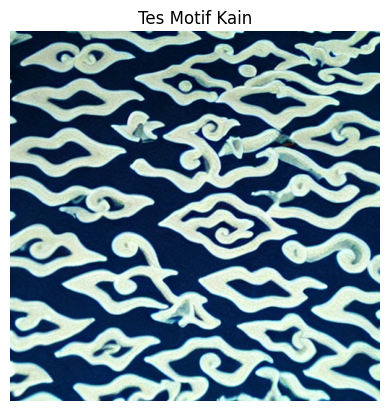

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

# --- GANTI PATH INI SESUAI FOLDER HASIL TRAINING KAMU ---
MODEL_PATH = "/content/drive/MyDrive/COLAB/ModelLora6" # <--- CEK INI LAGI

# Cek Trigger Word kamu di metadata.jsonl, sesuaikan di sini:
TRIGGER_WORD = "batik_style_megamendung"

print(f"⚙️ Memuat model dari: {MODEL_PATH}")
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

try:
    pipe.load_lora_weights(MODEL_PATH)
    print("✅ LoRA Berhasil di-load! Model siap.")
except Exception as e:
    print(f"❌ GAGAL LOAD LoRA: {e}")
    print("STOP! Jangan lanjut dulu. Perbaiki path foldernya.")

# Prompt Simpel (Hanya Kain)
prompt = f"({TRIGGER_WORD}:1.5), texture of batik fabric, traditional cloud pattern, close up, detailed"

print("🎨 Sedang menggambar kain...")
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

plt.imshow(image)
plt.axis("off")
plt.title("Tes Motif Kain")
plt.show()